In [2]:
include("./fitting.jl");
using ProgressMeter, LsqFit, GLM

In [8]:
N=100;
M=50;
L = 0.3;
### Temp params 
num_temps = 38;
Tr=273.15+10; Ed=3.5;

In [9]:
Temp_rich = range(0, num_temps-1, length = num_temps);
k = 0.0000862 # Boltzman constant
x = -1/k .* (1 ./(Temp_rich .+273.15) .- 1/Tr);
temp = collect(Temp_rich .+273.15);
temp_SS(T, params) = params[1] .* exp.((-params[2]./k) * ((1 ./T) .-(1/Tr)))./(1 .+ (params[2]./(params[4] .- params[2])) .* exp.(params[4]/k * (1 ./params[3] .- 1 ./T)));

### $\rho = -1$

In [47]:
@load "../data/1com-1.jld2" all_ℵii all_ℵij all_up_ℵij all_low_ℵij all_ℵij_sum all_D_ℵij all_ℵii_sur all_ℵij_sur all_up_ℵij_sur all_low_ℵij_sur all_ℵij_sum_sur all_D_ℵij_sur;
D = (all_ℵii = all_ℵii, all_ℵij = all_ℵij, all_up_ℵij = all_up_ℵij,all_low_ℵij = all_low_ℵij, all_ℵij_sum= all_ℵij_sum, all_D_ℵij = all_D_ℵij,
    all_ℵii_sur = all_ℵii_sur,  all_ℵij_sur = all_ℵij_sur, all_up_ℵij_sur = all_up_ℵij_sur, all_low_ℵij_sur = all_low_ℵij_sur, all_ℵij_sum_sur = all_ℵij_sum_sur, all_D_ℵij_sur = all_D_ℵij_sur);
Dnames = ("αii", "αij", "up_αij", "low_αij", "sum_αij", "up_low", "αii_sur", "αij_sur", "up_αij_sur", "low_αij_sur", "sum_αij_sur", "up_low_sur");


$\alpha_{ii}$

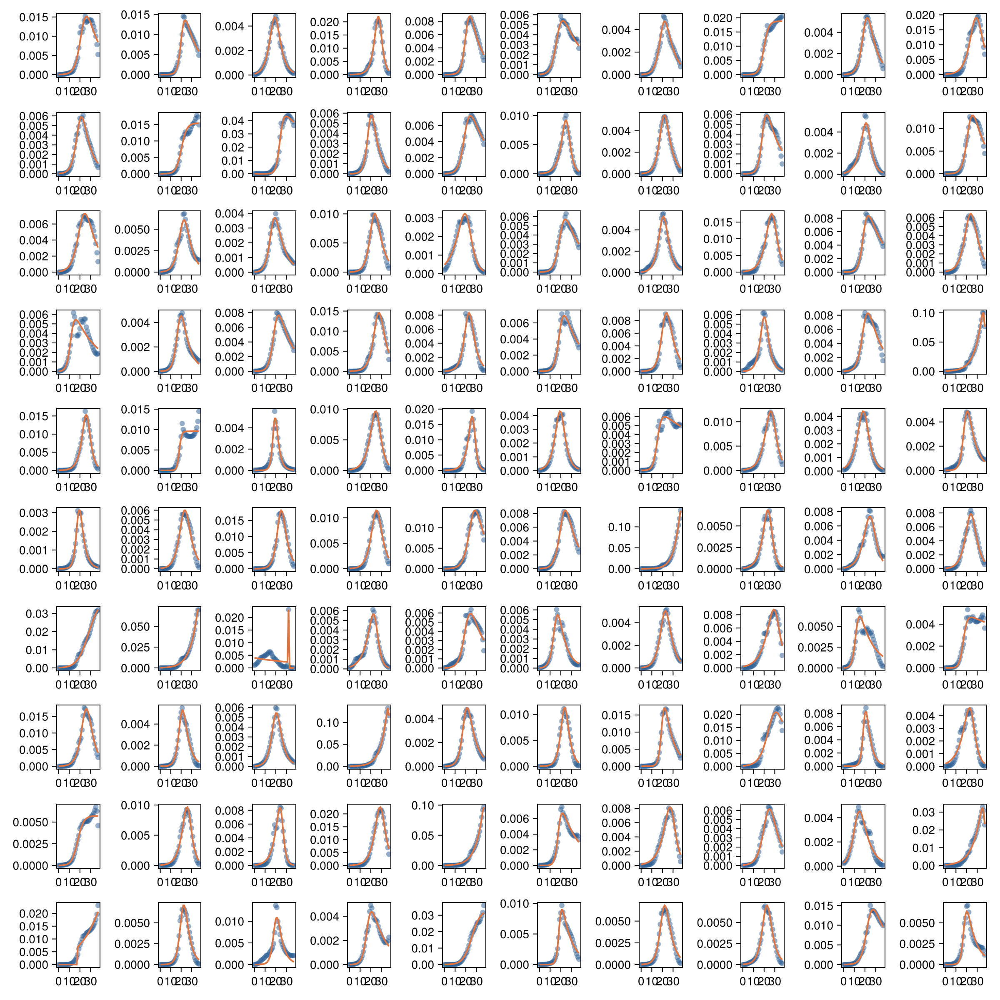

In [55]:
f1 = Figure(size = (1200, 1200));
fitted = CSV.read("../results/αii_fitted-1.csv", DataFrame, header=false)
temp = collect(Temp_rich .+273.15)
for i in 1:N 
    params = fitted[Int(i),1:4]
    αii = [all_ℵii[t][i] for t in 1:num_temps]
    pred = abs.(temp_SS(temp, params))
    ax1 = Axis(f1[Int(floor((i-1)/10+1)),Int((i-1) % 10+1)], ygridvisible = false, xgridvisible = false)
    scatter!(ax1, Temp_rich, abs.(αii), color = "#285C93", alpha = 0.5)
    lines!(ax1, Temp_rich, pred, color = ("#E17542", 1), linewidth = 2)
end 
display(f1);

In [6]:
fitted = CSV.read("../results/αii_fitted-1.csv", DataFrame, header=false)
df_names = ["B0","E","Th","Ed","AIC","r2"]
fitted = DataFrame(fitted, df_names);

println("mean_Bii = ", mean(log.(fitted.B0)),"\n", 
"var_Bii = ", var(log.(fitted.B0))/abs(mean(log.(fitted.B0))), "\n",
"mean_Eii = ", mean(fitted.E), "\n",
"var_Eii = ", var(fitted.E)/abs(mean(fitted.E)), "\n",
"cor_ii = ", cor(log.(fitted.B0), fitted.E), "\n")


mean_Bii = -7.288427253444144
var_Bii = 0.7903713099373256
mean_Eii = 2.0727575586420715
var_Eii = 0.732231716409591
cor_ii = -0.8025791541054943



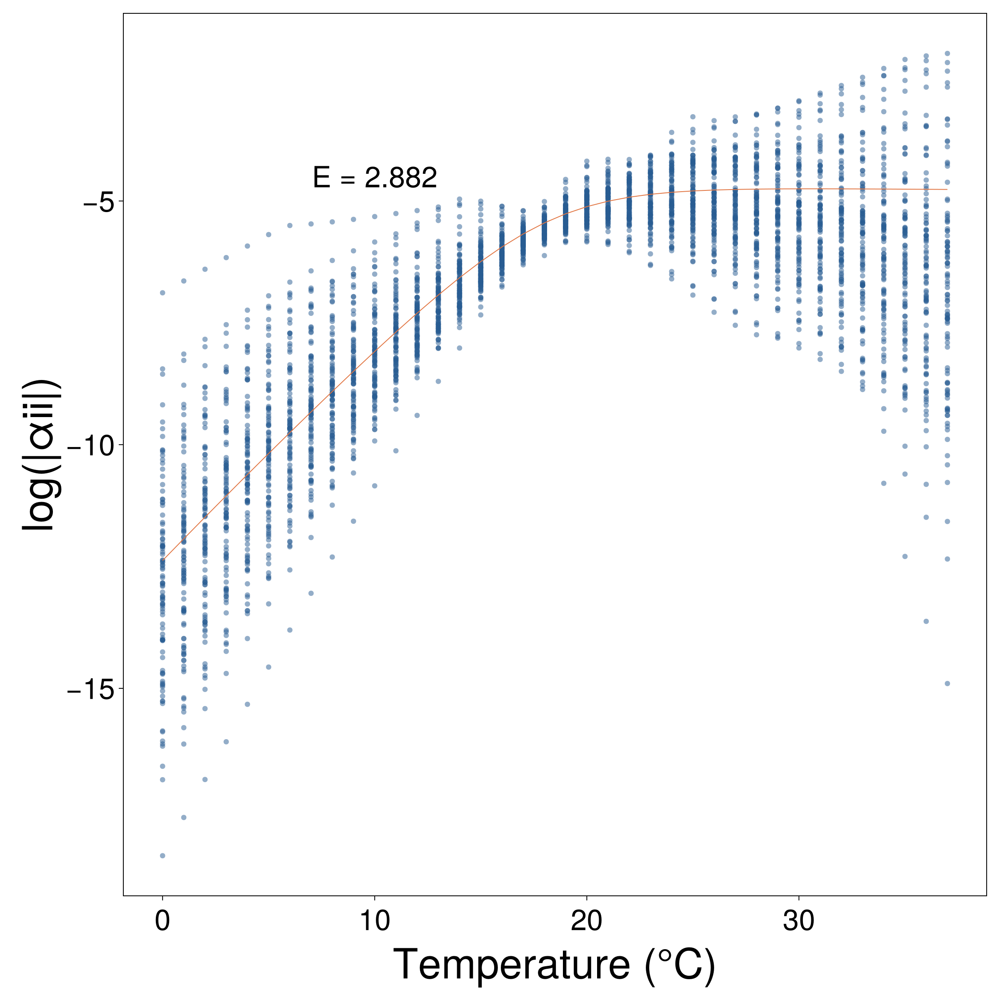

In [11]:
Nα, B_m, E_m, T_m, Ed,temp_all, allα = get_init_param(all_ℵii, num_temps)
E_p = mean(fitted.E[fitted.E .> 0])
T_p = mean(fitted.Th[fitted.Th .> 0])
init_in = [exp(B_m), E_p, T_p, Ed]
fit_ii = curve_fit(temp_SS, temp_all, allα, init_in)
## calculate_r2
r_square = calculate_r2(fit_ii, temp_all, allα)
pred = abs.(temp_SS(temp, fit_ii.param))
E = fit_ii.param[2]

f = Figure(fontsize = 35,size = (1200, 1200));
ax = Axis(f[1,1], xlabel = "Temperature (°C)", ylabel = "log(|αii|)", ygridvisible = false, xgridvisible = false, xlabelsize = 50, ylabelsize = 50)
scatter!(ax, temp_all .- 273.15, log.(abs.(allα)), color = "#285C93", alpha = 0.5)
lines!(ax, Temp_rich, log.(pred), color = ("#E17542", 1), linewidth = 1)
text!(10, -4.5, text = "E = $(round(E, digits = 3))", align = (:center, :center), fontsize = 35)
f

$\sum_j \alpha_{ij}$

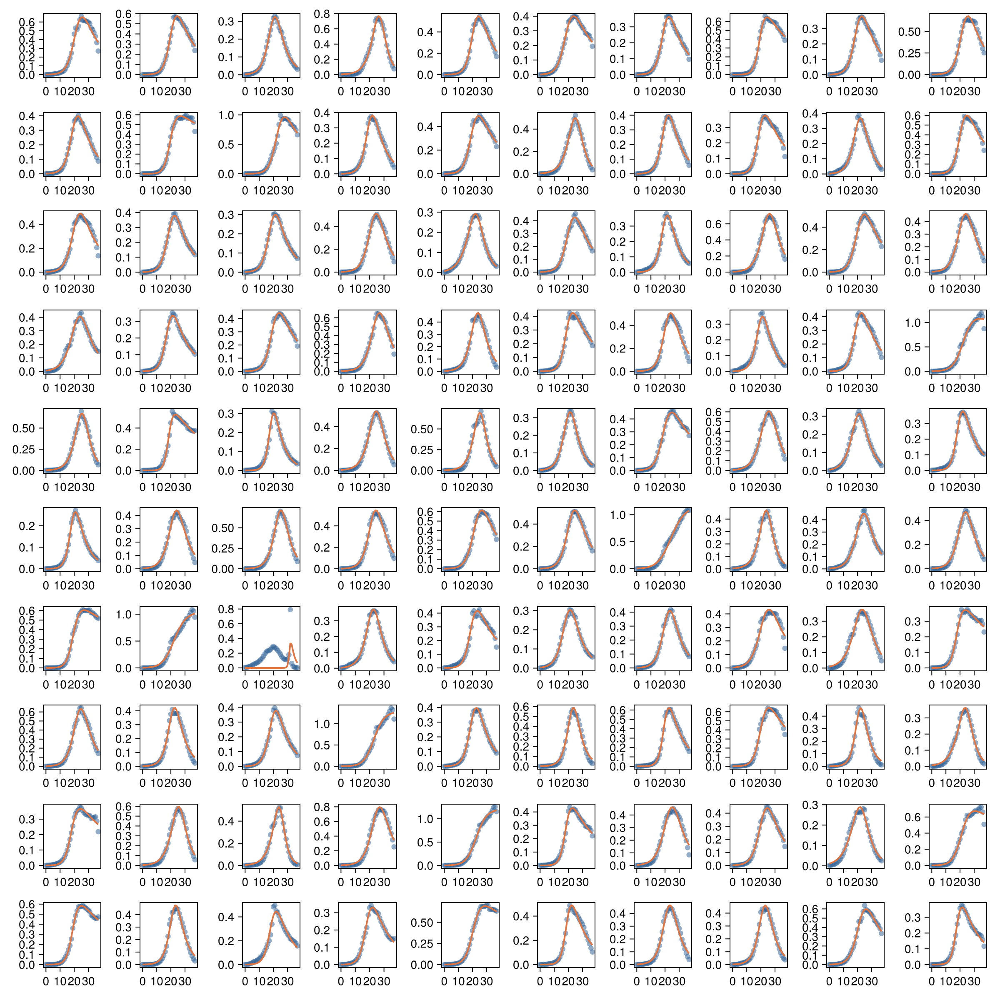

In [58]:
f2 = Figure(size = (1200, 1200));
fitted = CSV.read("../results/αij_sum_fitted-1.csv", DataFrame, header=false)
temp = collect(Temp_rich .+273.15)
for i in 1:N 
    params = fitted[Int(i),1:4]
    αij = [all_ℵij_sum[t][i] for t in 1:num_temps]
    pred = abs.(temp_SS(temp, params))
    ax2 = Axis(f2[Int(floor((i-1)/10+1)),Int((i-1) % 10+1)], ygridvisible = false, xgridvisible = false)
    scatter!(ax2, Temp_rich, abs.(αij), color = "#285C93", alpha = 0.5)
    lines!(ax2, Temp_rich, pred, color = ("#E17542", 1), linewidth = 2)
end 
display(f2);

In [62]:
fitted_all = CSV.read("../results/αij_fitted_all-1.csv", DataFrame, header=false)
df_names = ["B0","E","Th","Ed","AIC","r2"]
fitted_all = DataFrame(fitted_all, df_names);
fitted_all_filter = fitted_all[fitted_all.B0 .> 0, :]
fitted_all_filter = fitted_all_filter[fitted_all_filter.E .> 0, :]

println("mean_Bij = ", mean(log.(fitted_all_filter.B0)),"\n", 
"var_Bij = ", var(log.(fitted_all_filter.B0))/abs(mean(log.(fitted_all_filter.B0))), "\n",
"mean_Eij = ", mean(fitted_all_filter.E), "\n",
"var_Eij = ", var(fitted_all_filter.E)/abs(mean(fitted_all_filter.E)), "\n",
"cor_ij = ", cor(log.(fitted_all_filter.B0), fitted_all_filter.E), "\n")

mean_Bij = -8.356821922883677
var_Bij = 0.16616741940117374
mean_Eij = 2.2502044844743083
var_Eij = 0.2995772684350095
cor_ij = -0.7352456219965822



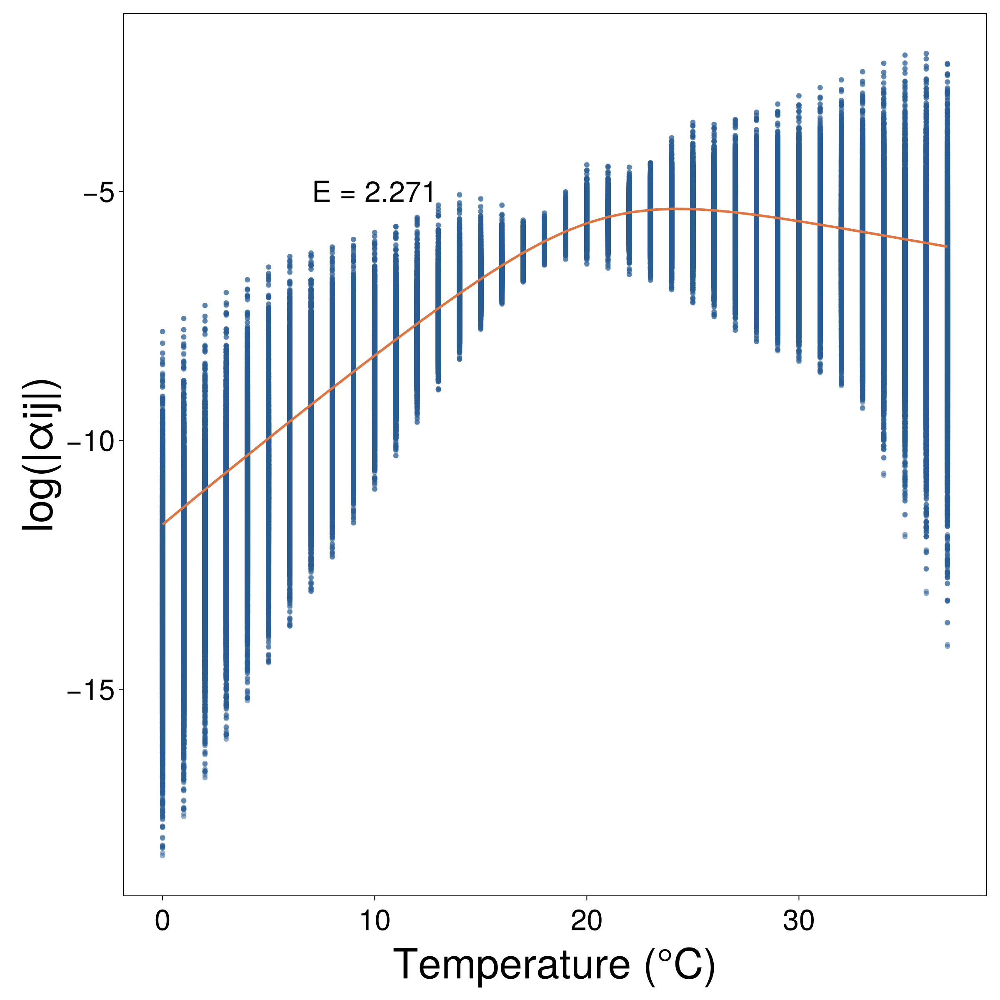

In [61]:
Nα, B_m, E_m, T_m, Ed,temp_all, allα = get_init_param(all_ℵij, num_temps)
E_p = mean(fitted_all_filter.E[fitted_all_filter.E .> 0])
T_p = mean(fitted_all_filter.Th[fitted_all_filter.Th .> 0])
init_in = [exp(B_m), E_p, T_p, Ed]
fit_ij = curve_fit(temp_SS, temp_all, allα, init_in)
## calculate_r2
r_square = calculate_r2(fit_ij, temp_all, allα)
pred = abs.(temp_SS(temp, fit_ij.param))
E = fit_ij.param[2]

f = Figure(fontsize = 35,size = (1200, 1200));
ax = Axis(f[1,1], xlabel = "Temperature (°C)", ylabel = "log(|αij|)", ygridvisible = false, xgridvisible = false, xlabelsize = 50, ylabelsize = 50)
scatter!(ax, temp_all .- 273.15, log.(abs.(allα)), color = "#285C93", alpha = 0.5)
lines!(ax, Temp_rich, log.(pred), color = ("#E17542", 1), linewidth = 3)
text!(10, -5, text = "E = $(round(E, digits = 3))", align = (:center, :center), fontsize = 35)
f

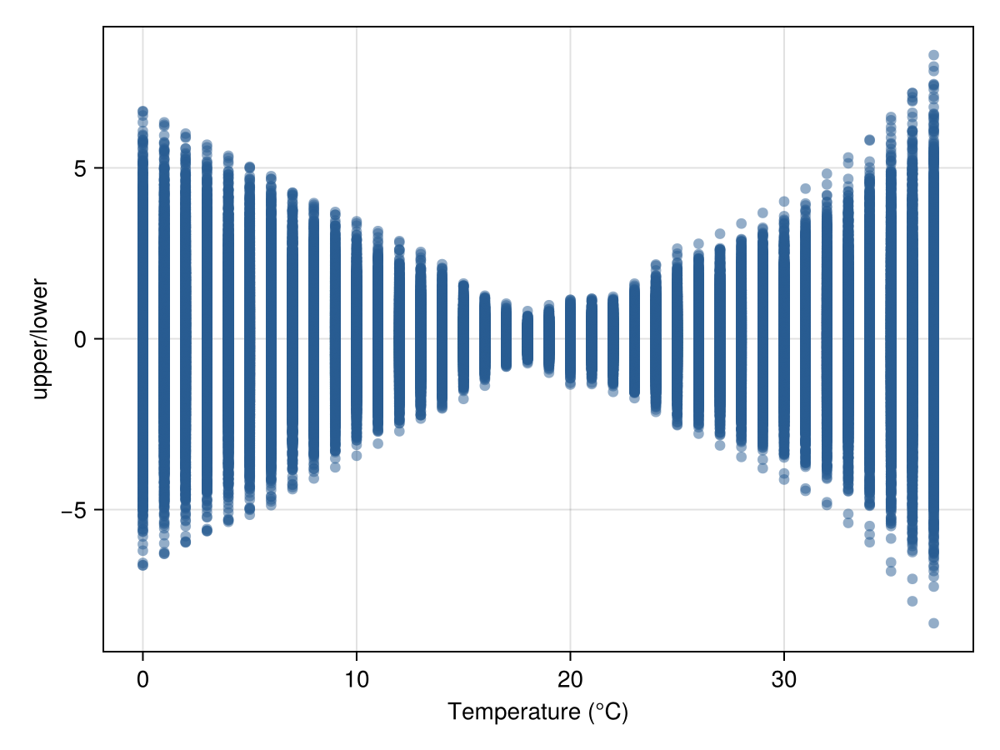

In [64]:
f = Figure()
ax = Axis(f[1,1], xlabel = "Temperature (°C)", ylabel = "upper/lower")
Nα, B_m, E_m, T_m, Ed,temp_all, allα = get_init_param(all_D_ℵij, num_temps)
scatter!(ax, temp_all.-273.15, log.(abs.(allα)), color = "#285C93", alpha = 0.5)
display(f);